In [1]:
import matplotlib.patches as mpatches

In [2]:
from glob import glob
from matplotlib import pyplot as plt

In [3]:
import os

In [38]:
from scipy.stats import spearmanr, pearsonr, gaussian_kde, mannwhitneyu, wilcoxon
import numpy as np
import pandas as pd

In [5]:
import sqlite3 as lite 

In [6]:
from matplotlib import pyplot as plt

In [7]:
plt.rcParams["font.family"] = "Arial Narrow"

# Load compartments

In [8]:
times = ['0h', '1h', '4h', '7h', '10h', '24h']

In [9]:
db_path = '../../data/ComplementaryData/HiC/TADbit_results/'

In [10]:
ev_indexes = [1, 2]

In [23]:
hashs = {}
wjobids = {}
for time in times:
    hashs[time] = {}
    wjobids[time] = {}
    con = lite.connect(os.path.join(
        db_path, 'Cabrera_2022_HCT116_WT_NUT_{}/trace.db').format(time))
    cur = con.cursor()
    cur.execute("""
    select distinct Id, Parameters, Parameters_md5 from JOBs
    where Type = 'Segment' AND Parameters like '%only_compartments:1%'
    """)
    jobids = cur.fetchall()
    for ev_index in ev_indexes:
        if ev_index == 1:
            test_ev = lambda x: 'ev_index:[2]' not in x
        else:
            test_ev = lambda x: 'ev_index:[2]' in x
        hashs[time][ev_index] = {}
        wjobids[time][ev_index] = {}
        for jobid, parameters, md5 in jobids:
            if test_ev(parameters):
                c = parameters.split('crms:[')[1].split(']')[0]
                hashs[time][ev_index][c] = md5
                wjobids[time][ev_index][c] = jobid
    con.close()
    con = lite.connect(os.path.join(
        db_path, 'Cabrera_2022_HCT116_WT_NUT_{}/trace.db').format(time))
    cur = con.cursor()
    cur.execute("""
    select distinct JOBid, richA_corr from SEGMENT_OUTPUTs
    """)
    jobids = dict(cur.fetchall())
    for ev_index in ev_indexes:
        for c in wjobids[time][ev_index]:
            wjobids[time][ev_index][c] = abs(jobids[wjobids[time][ev_index][c]])
    con.close()

In [24]:
cpath = os.path.join(db_path, 'Cabrera_2022_HCT116_WT_NUT_{}/06_segmentation/compartments_100kb/{}_EigVect{}_{}.tsv')

In [25]:
chromosomes = [f'chr{c}' for c in list(range(1, 23)) + ['X']]

In [26]:
h = 'hash'
evs = {}
for time in times:
    evs[time] = {}
    for nev in ev_indexes:
        evs[time][nev] = {}
        for c in chromosomes:
            evs[time][nev][c] = {}
            try:
                fh = open(cpath.format(time.replace('Nutlin', 'NUT'), 
                                       c, nev, hashs[time][nev][c]))
            except KeyError:
                print('MISSING:', time, nev, c)
                continue
            next(fh)
            for nl, line in enumerate(fh):
                ev = line.split('\t')[nev - 1]
                evs[time][nev][c][nl] = float(ev)

## manually define which EV to choose

In [27]:
which_ev = {
    ('0h'): {
        'chr2' : 2,  # manual inspection
        'chr4' : 2,
        'chr7' : 2,
        'chr12': 1,  # manual inspection
    },
    ('1h'): {
        'chr2' : 2,  # manual inspection
        'chr4' : 2,
        'chr7' : 2,
        'chr12': 1,  # manual inspection
    },
    ('4h'): {
        'chr2' : 2,  # manual inspection
        'chr4' : 2,
        'chr7' : 2,
        'chr12': 1,  # manual inspection
    },
    ('7h'): {
        'chr2' : 2,  # manual inspection
        'chr4' : 2,
        'chr7' : 2,
        'chr12': 1,  # manual inspection
    },
    ('10h'): {
        'chr2' : 2,  # manual inspection
        'chr4' : 2,
        'chr7' : 2,
        'chr12': 1,  # manual inspection
    },
    ('24h'): {
        'chr2' : 2,  # manual inspection
        'chr4' : 2,
        'chr7' : 2,
        'chr12': 1,  # manual inspection
    }
}

In [28]:
h = 'hash'
evs = {}
for time in times:
    evs[time] = {}
    for c in chromosomes:
        evs[time][c] = {}
        nev = which_ev[time].get(c, 1)
        fh = open(cpath.format(time, c, nev, hashs[time][nev][c]))
        next(fh)
        for n, line in enumerate(fh):
            ev = line.split('\t')[nev - 1]
            evs[time][c][n] = float(ev)

In [29]:
for n, c in enumerate(chromosomes, 1):
    all_evs = dict((t, list(evs[t][c].values())) 
                   for t in times)
    max_len = max(len(all_evs[k]) for k in all_evs)
    for k in all_evs:
        if len(all_evs[k]) != max_len:
            all_evs[k].extend([float('nan')] * (max_len - len(all_evs[k])))
        evs[k][c] = dict((n, all_evs[k][n]) for n in range(len(all_evs[k])))

# normalize EVs

In [31]:
norm_evs = {}
for time in times:
    norm_evs[time] = {}
    for n, c in enumerate(chromosomes, 1):
        x = list(evs[time][c].values())
        minx, maxx = np.nanpercentile(x, [1, 99])
        norm_evs[time][c] = dict((i, -v / minx if v < 0 else v / maxx)
                                                 for i, v in enumerate(x))

# plot EVs

In [33]:
df = pd.read_csv('../../data/ComplementaryData/p53bindingsites_annotated.txt', sep='\t')

In [34]:
df[df['is_functional']]

,chr,start,end,is_functional,is_functional_Nut1h,is_functional_Nut10h,in_promoter,in_active_promoter,in_enhancer
0,17,81027504,81027726,True,True,False,False,False,False
2,6,26687121,26687343,True,True,True,False,False,False
3,1,68190934,68191156,True,True,True,False,False,True
4,2,19428605,19428827,True,False,True,False,False,False
5,3,5036687,5036909,True,True,True,False,False,True
...,...,...,...,...,...,...,...,...,...
4998,17,75404064,75404286,True,True,True,False,False,True
4999,19,3615942,3616164,True,True,True,False,False,False
5005,9,86500548,86500770,True,True,True,False,False,True
5006,11,60639603,60639825,True,False,True,False,False,False


In [36]:
fh = open('../../data/ComplementaryData/p53bindingsites_annotated.txt')
next(fh)
p53 = {}
p53['1h'] = dict((c, set()) for c in chromosomes)
p53['10h'] = dict((c, set()) for c in chromosomes)
for l in fh:
    c, b, e, isf, isf1h, isf10h, ip, iap, ie = l.split()
    if isf == 'TRUE':
        p53['1h'][f"chr{c}"].add(int(int(b) / 100_000))
    if isf == 'TRUE':
        p53['10h'][f"chr{c}"].add(int(int(b) / 100_000))

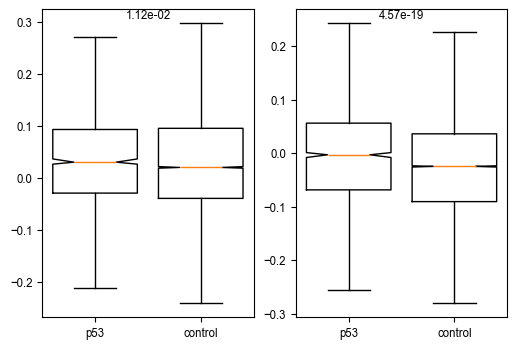

In [39]:
t0 = '0h'
plt.figure(figsize=(6, 4))
for nplot, t1 in enumerate(['1h', '10h'], 1):
    axe = plt.subplot(1, 2, nplot)
    X = []
    Y = []
    for n, c in enumerate(chromosomes, 1):
        x = norm_evs[t0][c].items()
        y = norm_evs[t1][c].items()
        X.extend([v for k, v in x if k not in p53[t1][c]])
        Y.extend([v for k, v in y if k not in p53[t1][c]])

    Xp53 = []
    Yp53 = []
    for n, c in enumerate(chromosomes, 1):
        x = norm_evs[t0][c].items()
        y = norm_evs[t1][c].items()
        Xp53.extend([v for k, v in x if k in p53[t1][c]])
        Yp53.extend([v for k, v in y if k in p53[t1][c]])
    vals = [b - a for a, b in zip(X, Y) if np.isfinite(a - b)]
    valsp53 = [b - a for a, b in zip(Xp53, Yp53) if np.isfinite(a - b)]
    plt.boxplot([valsp53, vals], widths=0.8, labels=['p53', 'control'],
                notch=True, bootstrap=1000, showfliers=False)
    _, pv = mannwhitneyu(vals, valsp53)
    plt.ylabel('')
    plt.text(1.5, axe.get_ylim()[1], f"{pv:.2e}", va='top', ha='center')

/tmp/ipykernel_95393/514257735.py:93: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


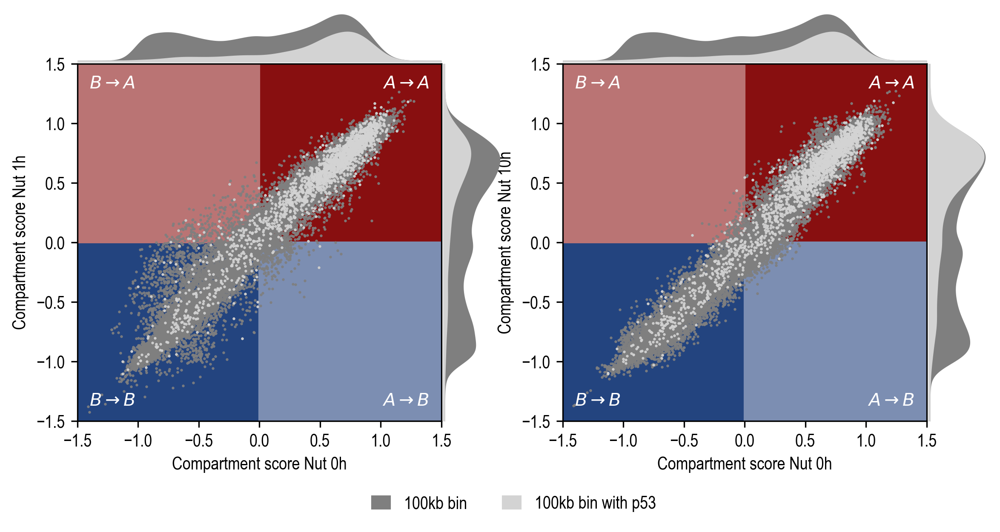

In [40]:
fig, axes = plt.subplots(1, 6, figsize=(9.5, 4), dpi=300)
axe1, axe2, axe1u, axe1r, axe2u, axe2r = axes

axes = {
    1: {
        'main': axe1,
        'up': axe1u,
        'right': axe1r,
    },
    2: {
        'main': axe2,
        'up': axe2u,
        'right': axe2r,
    }
}

axe1.set_position((0.1, 0.1, 0.3, 0.7))
axe1u.set_position((0.1, 0.8, 0.3, 0.1))
axe1r.set_position((0.4, 0.1, 0.05, 0.7))
axe2.set_position((0.5, 0.1, 0.3, 0.7))
axe2u.set_position((0.5, 0.8, 0.3, 0.1))
axe2r.set_position((0.8, 0.1, 0.05, 0.7))
axe1u.axis('off')
axe1r.axis('off')
axe2u.axis('off')
axe2r.axis('off')


axe1.sharex(axe1u)
axe1.sharey(axe1r)
axe2.sharex(axe2u)
axe2.sharey(axe2r)
# axe1.get_shared_x_axes().join(axe1, axe1u)
# axe1.get_shared_y_axes().join(axe1, axe1r)
# axe2.get_shared_x_axes().join(axe2, axe2u)
# axe2.get_shared_y_axes().join(axe2, axe2r)

t0 = '0h'
t1 = '1h'

for nplot, t1 in enumerate(['1h', '10h'], 1):
    X = []
    Y = []
    for n, c in enumerate(chromosomes, 1):
        x = norm_evs[t0][c].values()
        y = norm_evs[t1][c].values()
        X.extend(x)
        Y.extend(y)

    Xp53 = []
    Yp53 = []
    for n, c in enumerate(chromosomes, 1):
        x = norm_evs[t0][c].items()
        y = norm_evs[t1][c].items()
        Xp53.extend([v for k, v in x if k in p53[t1][c]])
        Yp53.extend([v for k, v in y if k in p53[t1][c]])

    axes[nplot]['main'].plot(X, Y, '.', color='tab:grey', alpha=1, ms=1)
    axes[nplot]['main'].plot(Xp53, Yp53, '.', color='lightgrey', alpha=1, ms=1)
    axes[nplot]['main'].set_xlabel(f"Compartment score Nut {t0}")
    axes[nplot]['main'].set_ylabel(f"Compartment score Nut {t1}")
    axes[nplot]['main'].set_xlim(-1.5, 1.5)
    axes[nplot]['main'].set_ylim(-1.5, 1.5)

    kde = gaussian_kde([v for v in X if np.isfinite(v)])
    kdep53 = gaussian_kde([v for v in Xp53 if np.isfinite(v)])
    xx = np.linspace(-1.5, 1.5, 1000)
    mx = np.nanmedian(X)
    # axe1u.plot([mx, mx], [0, kde(mx)[0]], 'tab:red', linestyle=':', alpha=0.75)
    axes[nplot]['up'].fill_between(xx, kde(xx) / np.nansum(Xp53), color='tab:grey')
    axes[nplot]['up'].fill_between(xx, kdep53(xx) / np.nansum(X), color='lightgrey')

    kde = gaussian_kde([v for v in Y if np.isfinite(v)])
    kdep53 = gaussian_kde([v for v in Yp53 if np.isfinite(v)])
    yy = np.linspace(-1.5, 1.5, 1000)
    my = np.nanmedian(Y)
    axes[nplot]['right'].fill_betweenx(yy, kde(yy) / np.nansum(Yp53), color='tab:grey')
    axes[nplot]['right'].fill_betweenx(yy, kdep53(yy) / np.nansum(Y), color='lightgrey')

    axes[nplot]['main'].fill_between([0, 1.5], 0, 1.5, color='#880F10')
    axes[nplot]['main'].fill_between([-1.5, 0], -1.5, 0, color='#23447F')
    axes[nplot]['main'].fill_between([-1.5, 0], 0, 1.5, color='#BA7474')
    axes[nplot]['main'].fill_between([0, 1.5], -1.5, 0, color='#7C8EB2')
    axes[nplot]['main'].text(-1.4,  1.4, '$B\\rightarrow A$', color='w', va='top')
    axes[nplot]['main'].text( 1.4,  1.4, '$A\\rightarrow A$', color='w', va='top', ha='right')
    axes[nplot]['main'].text( 1.4, -1.4, '$A\\rightarrow B$', color='w', va='bottom', ha='right')
    axes[nplot]['main'].text(-1.4, -1.4, '$B\\rightarrow B$', color='w', va='bottom')

b = mpatches.Patch(color='tab:grey', label='100kb bin')
bp53 = mpatches.Patch(color='lightgrey', label='100kb bin with p53')
axes[1]['main'].legend(handles=[b, bp53], frameon=False, bbox_to_anchor=[1.2, -0.3], 
                       loc='lower center', ncols=2, handlelength=1)
plt.tight_layout()

In [48]:
def plot_EVs(ev1, ev2, xlabel=None, ylabel=None, min_val=None, max_val=None, title=None):
    fig, axes = plt.subplots(1, 3, figsize=(6, 6), dpi=300)
    axe, axeu, axer = axes
    axe.set_position((0.1, 0.1, 0.7, 0.7))
    axeu.set_position((0.1, 0.8, 0.7, 0.1))
    axer.set_position((0.8, 0.1, 0.1, 0.7))
    axeu.axis('off')
    axer.axis('off')
    axe.sharex(axeu)
    axe.sharey(axer)
    
    if min_val is None:
        min_val, max_val = np.nanpercentile(X + Y, [0, 100])

    r, pv = spearmanr(*zip(*([(i, j) for i, j in zip(ev1, ev2) if np.isfinite(i) and np.isfinite(j)])))
    axe.text(min_val * 0.95, max_val * 0.95, round(r, 2), va='top', ha='left')
    r, pv = pearsonr(*zip(*([(i, j) for i, j in zip(ev1, ev2) if np.isfinite(i) and np.isfinite(j)])))
    axe.text(min_val * 0.95, max_val * 0.85, round(r, 2), va='top', ha='left')
    axe.plot(ev1, ev2, 'k.', alpha=0.1, ms=2)
    axe.set_xlabel(xlabel)
    axe.set_ylabel(ylabel)
    axe.axvline(0, color='grey')
    axe.axhline(0, color='grey')
    axe.set_xticks([])
    axe.set_yticks([])
    axe.plot([-10, 10], [-10, 10], 'tab:red', alpha=0.5)
    axe.set_xlim(min_val, max_val)
    axe.set_ylim(min_val, max_val)

    kde = gaussian_kde([v for v in ev1 if np.isfinite(v)])
    xx = np.linspace(min_val * 1.1, max_val * 1.1, 1000)
    mx = np.nanmedian(ev1)
    axeu.plot([mx, mx], [0, kde(mx)[0]], 'tab:red', linestyle=':', alpha=0.75)
    axeu.fill_between(xx, kde(xx), color='tab:grey')
    axeu.set_title(title)

    kde = gaussian_kde([v for v in Y if np.isfinite(v)])
    yy = np.linspace(min_val * 1.1, max_val * 1.1, 1000)
    my = np.nanmedian(Y)
    axer.plot([0, kde(my)[0]], [my, my], 'tab:red', linestyle=':', alpha=0.75)
    axer.fill_betweenx(yy, kde(yy), color='tab:grey');


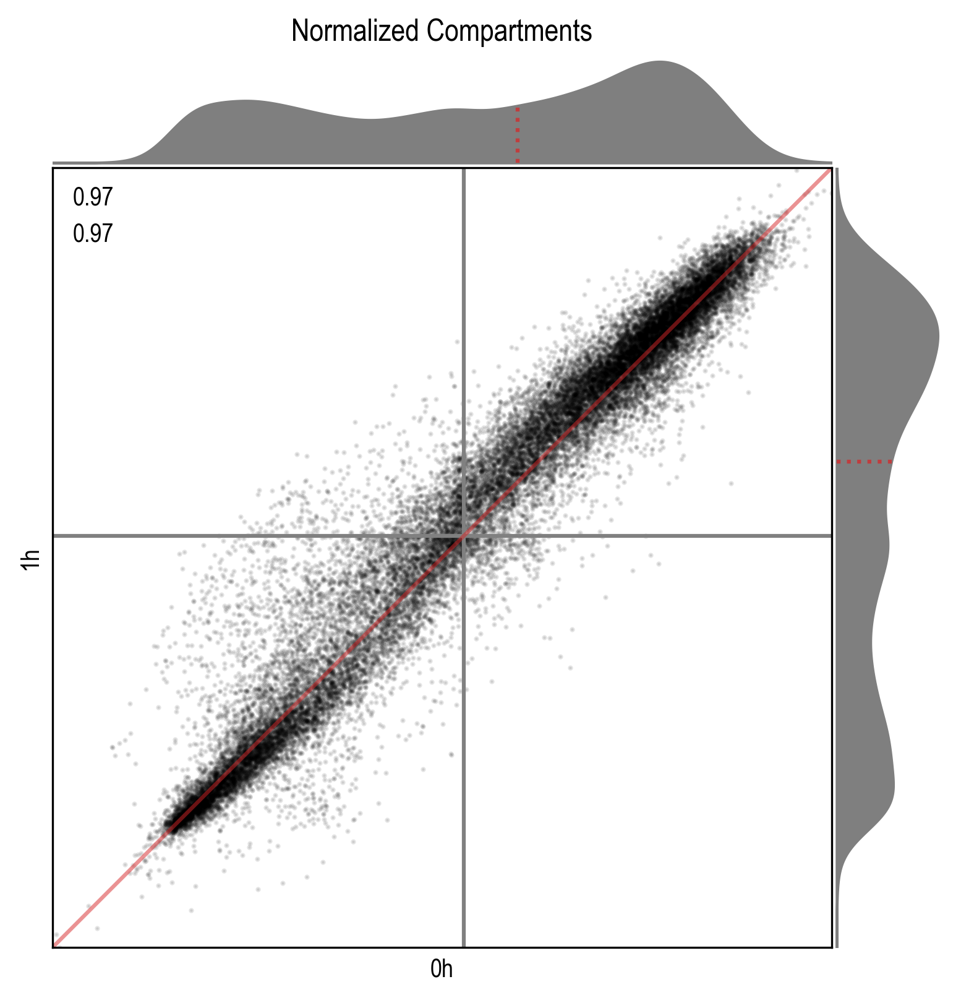

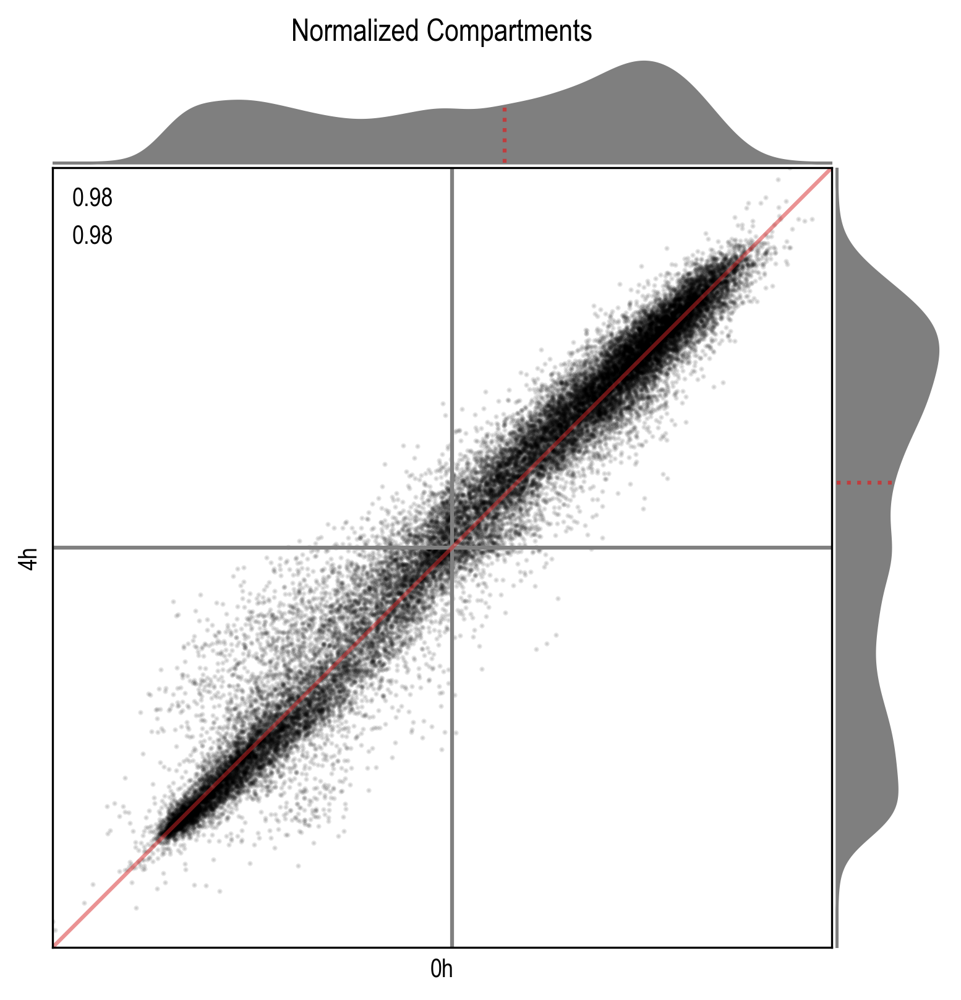

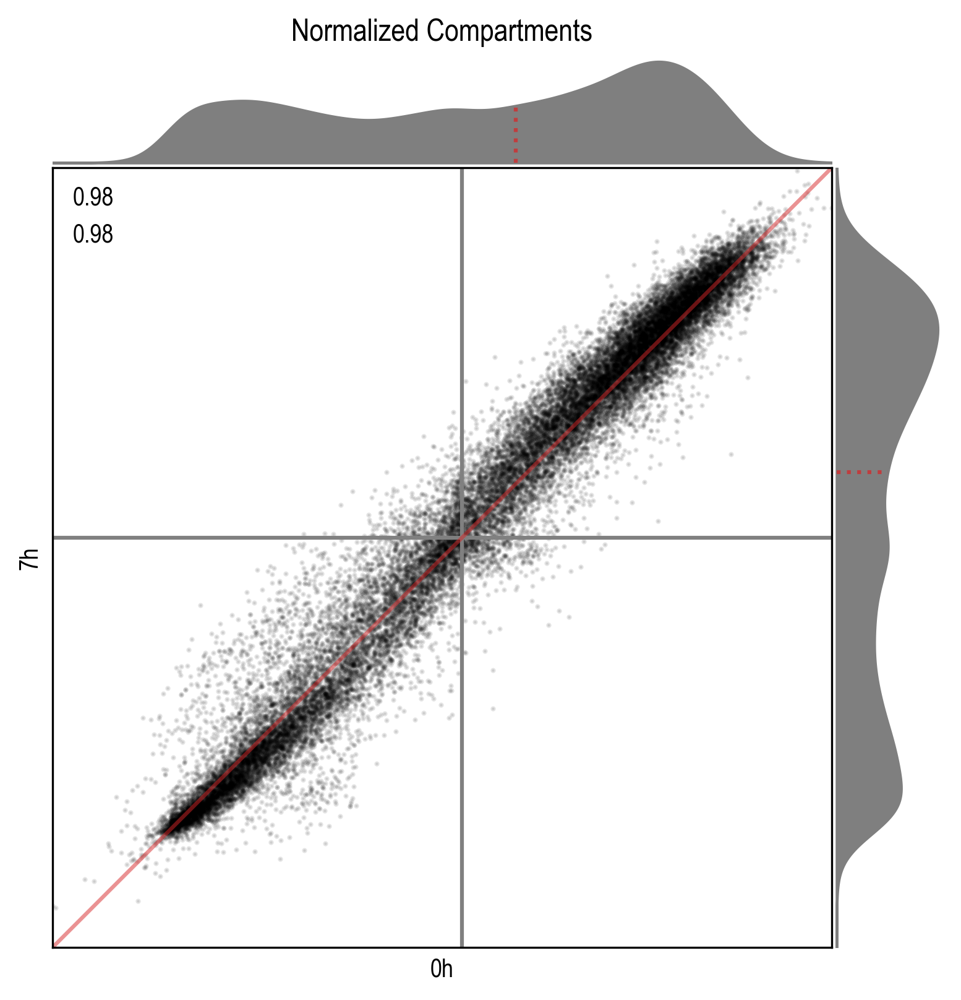

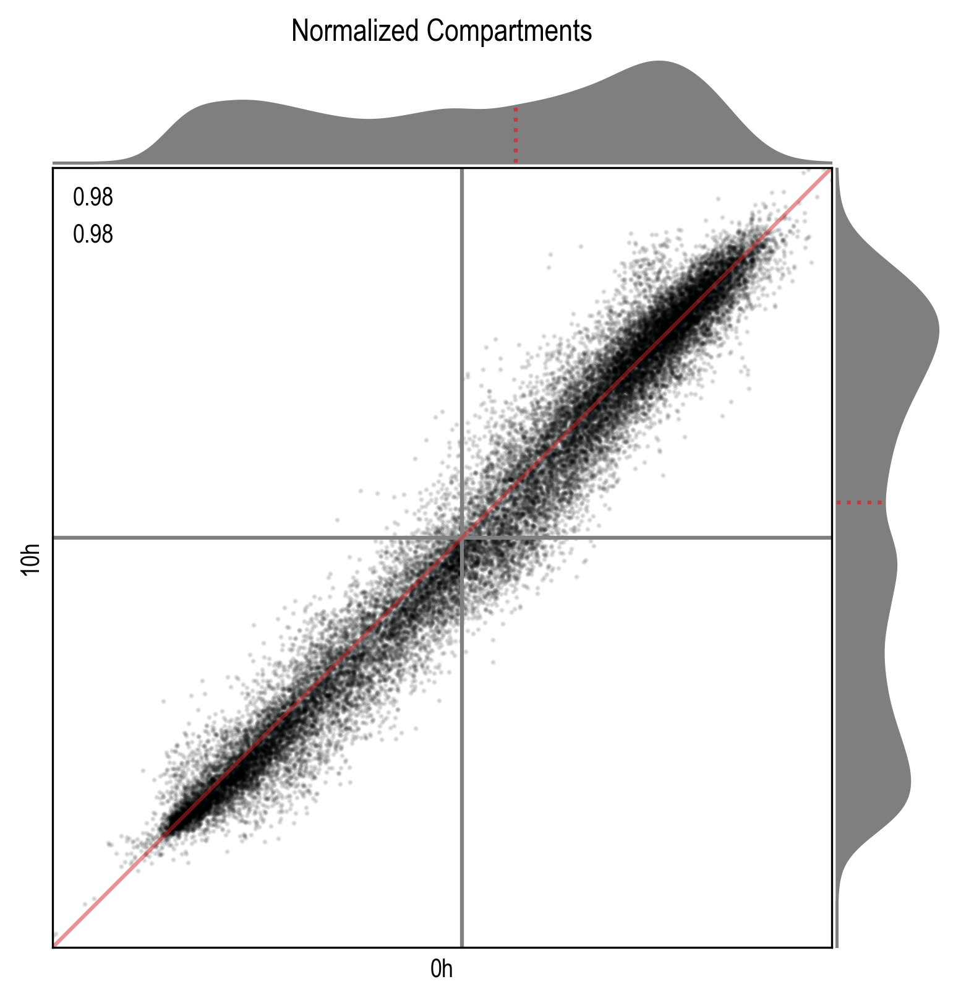

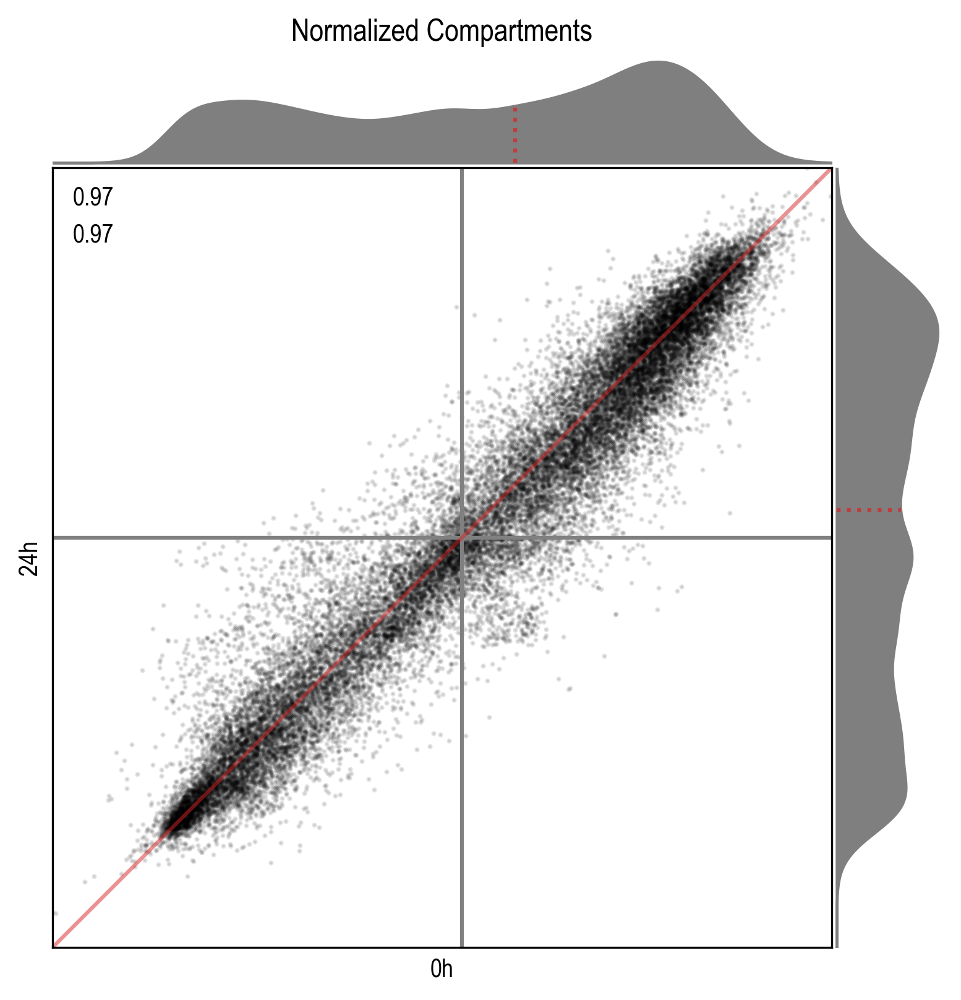

...

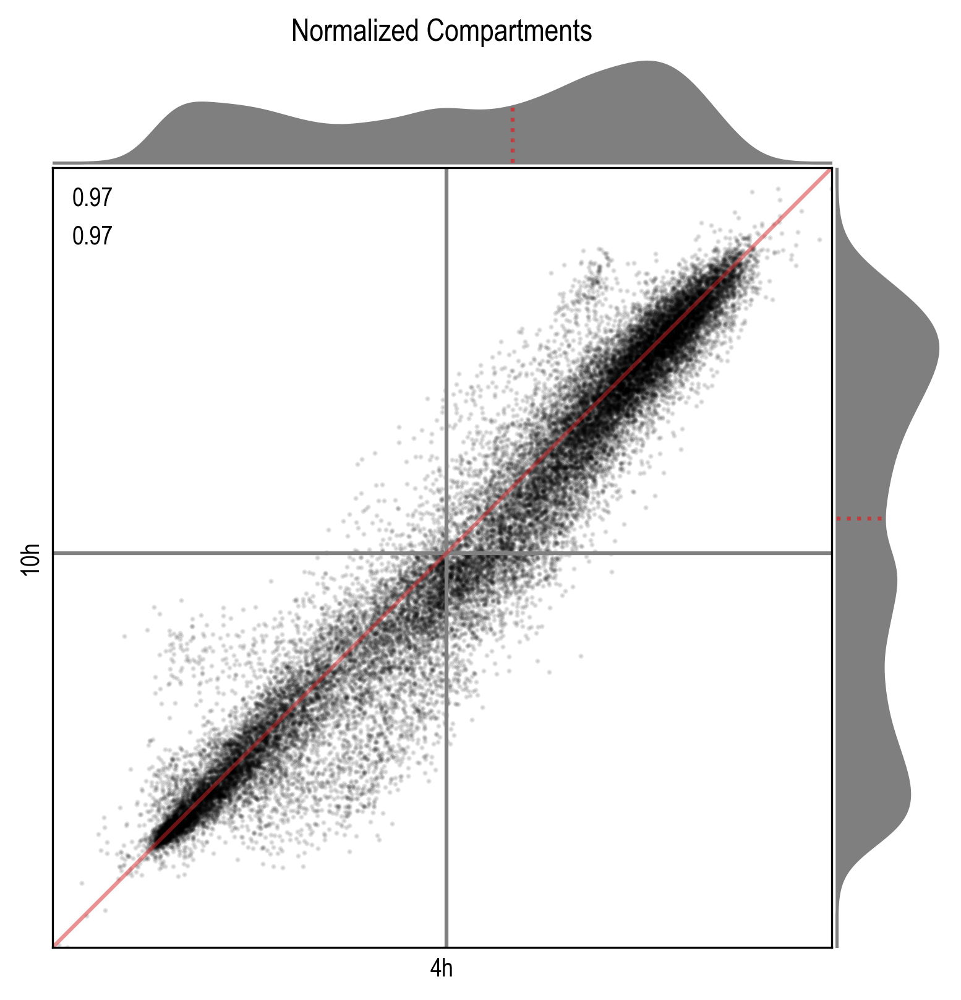

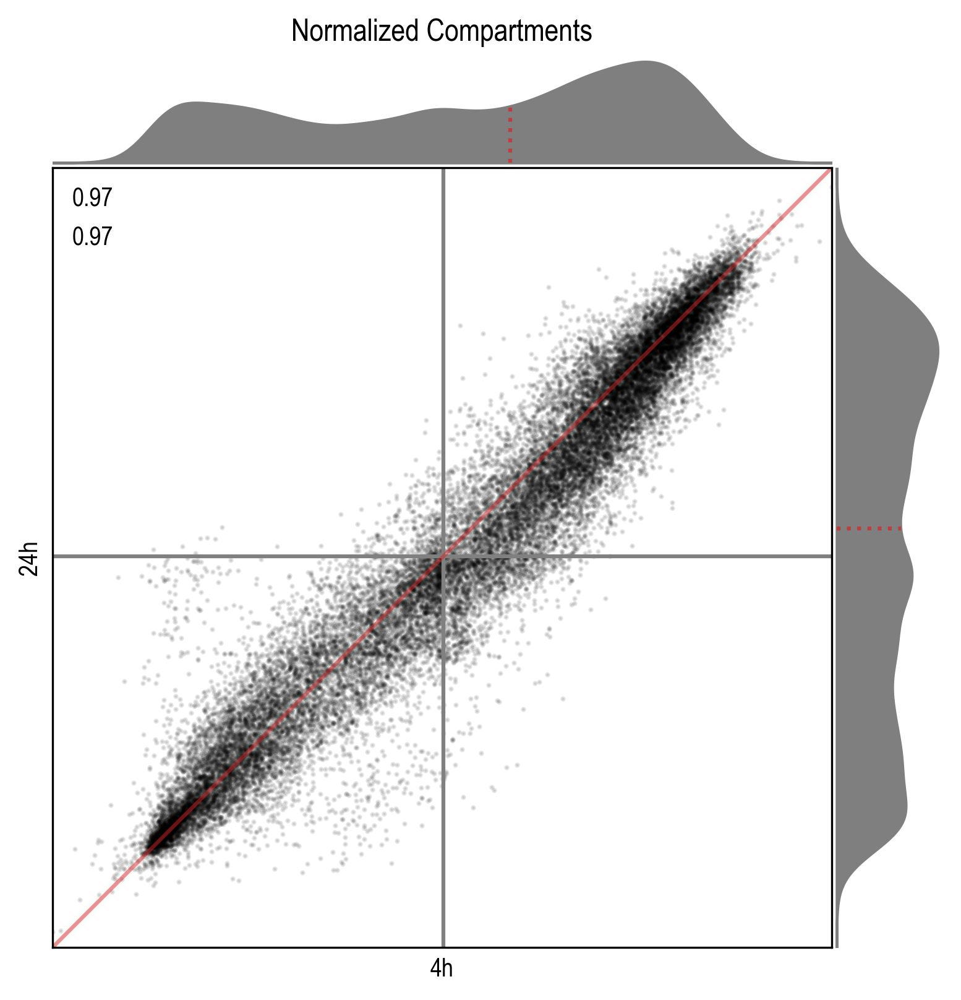

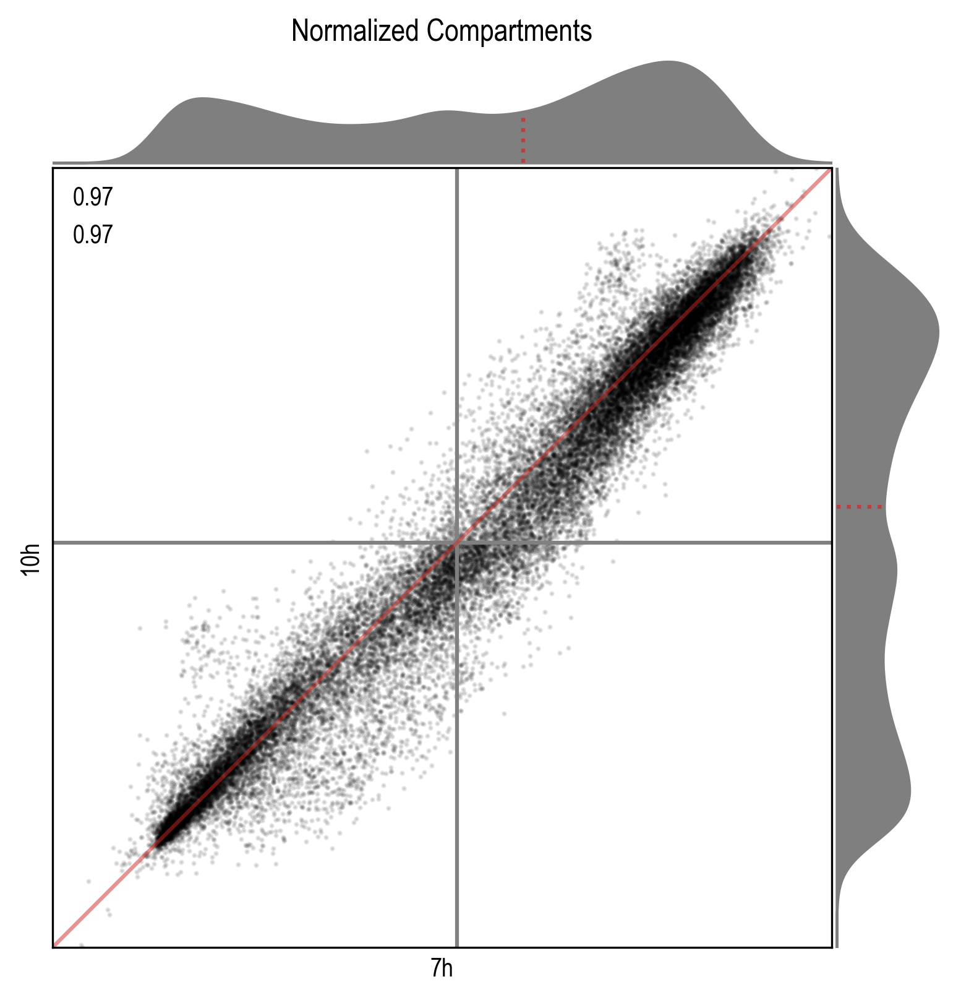

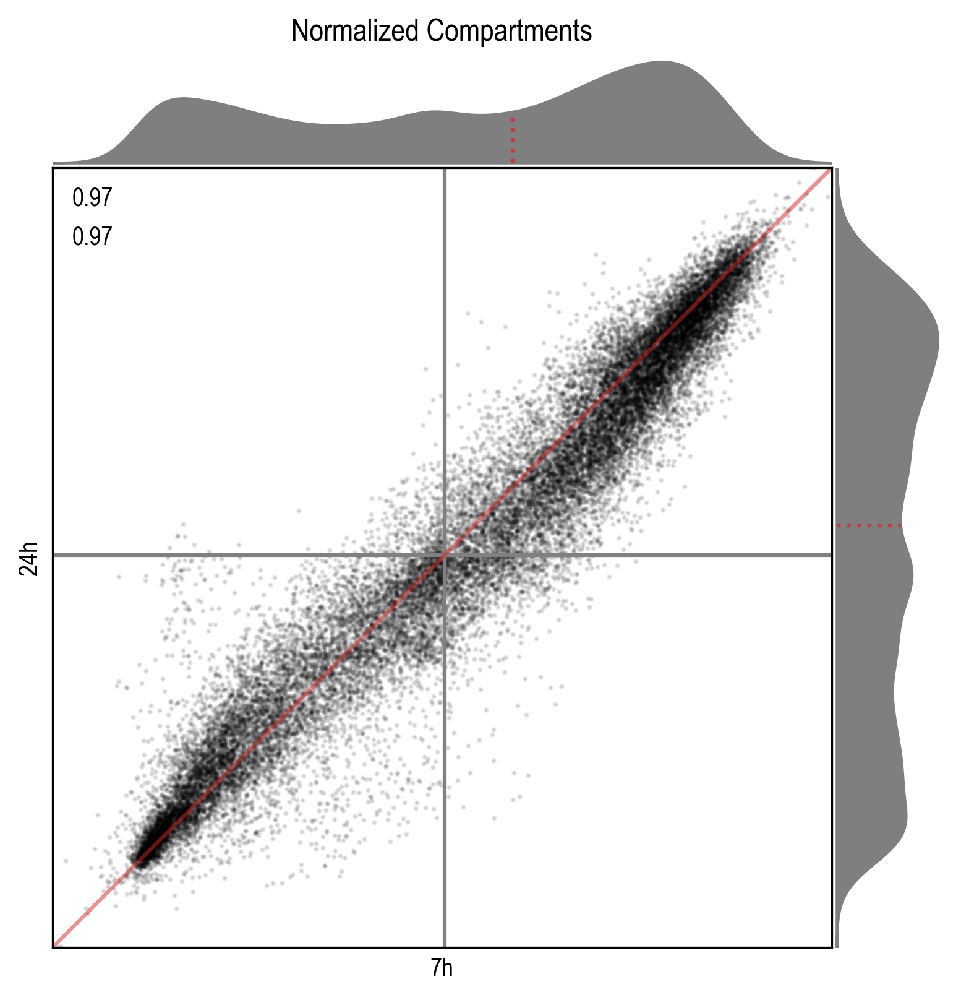

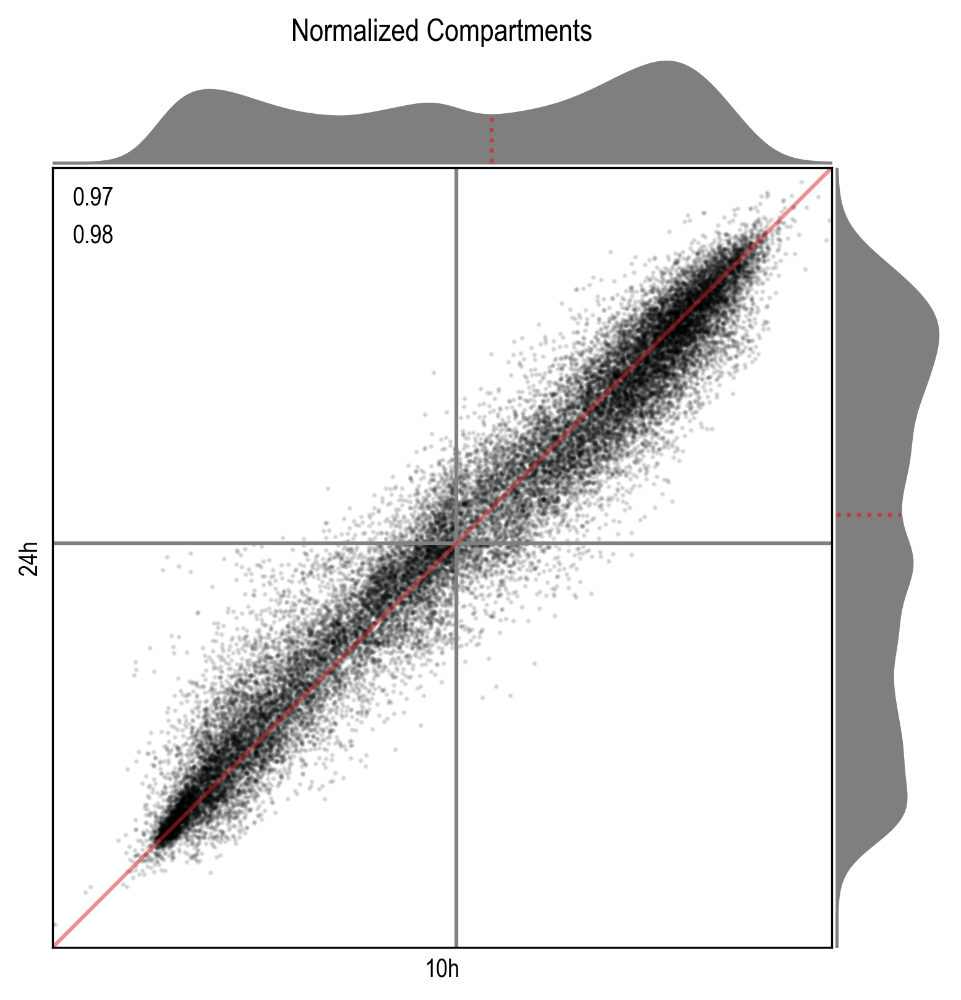

In [49]:
for nt, time1 in enumerate(times, 1):
    for time2 in times[nt:]:
        X = []
        Y = []
        for n, c in enumerate(chromosomes, 1):
            x = norm_evs[time1][c].values()
            y = norm_evs[time2][c].values()
            X.extend(x)
            Y.extend(y)
        plot_EVs(X, Y, xlabel=f'{time1}', ylabel=f'{time2}', title='Normalized Compartments')

proportion of A/B:

In [50]:
for time in times:
    x = [v for c in chromosomes for v in evs[time][c].values() if np.isfinite(v)]
    print(f'{time:>10} {sum(v > 0 for v in x) / (len(x)) * 100:.1f}% A compartment')


        0h 57.3% A compartment
        1h 60.1% A compartment
        4h 59.2% A compartment
        7h 58.4% A compartment
       10h 53.9% A compartment
       24h 53.8% A compartment


In [51]:
for time in times:
    x = [v for c in chromosomes for v in evs[time][c].values() if np.isfinite(v)]
    print(f'{time:>10} {sum(v < 0 for v in x) / (len(x)) * 100:.1f}% B compartment')


        0h 42.7% B compartment
        1h 39.9% B compartment
        4h 40.8% B compartment
        7h 41.6% B compartment
       10h 46.1% B compartment
       24h 46.2% B compartment
